In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.feature_selection import RFE
from sklearn.feature_selection import f_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [2]:
import pandas_profiling
import seaborn as sns
import itertools
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.formula.api as smf
from patsy import dmatrices

In [4]:
data=pd.read_excel('Data Set.xlsx')

In [5]:
data.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,0,1,1,0,0,0,1,0
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,1,0,0,0
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,1,0,0,0,0,0,1,0,0,0
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,1,0,1,1,1,0,1,1,0,0
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,1,0,1,0,1,0,0,0,1,0


In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
region,5000.0,3.001400,1.421760,1.000000,2.000000,3.000000,4.000000,5.000000
townsize,4998.0,2.687275,1.425925,1.000000,1.000000,3.000000,4.000000,5.000000
gender,5000.0,0.503600,0.500037,0.000000,0.000000,1.000000,1.000000,1.000000
age,5000.0,47.025600,17.770338,18.000000,31.000000,47.000000,62.000000,79.000000
agecat,5000.0,4.238800,1.308785,2.000000,3.000000,4.000000,5.000000,6.000000
ed,5000.0,14.543000,3.281083,6.000000,12.000000,14.000000,17.000000,23.000000
edcat,5000.0,2.672000,1.211738,1.000000,2.000000,2.000000,4.000000,5.000000
jobcat,5000.0,2.752800,1.737900,1.000000,1.000000,2.000000,4.000000,6.000000
union,5000.0,0.151200,0.358280,0.000000,0.000000,0.000000,0.000000,1.000000
employ,5000.0,9.730400,9.690929,0.000000,2.000000,7.000000,15.000000,52.000000


In [7]:
data.shape

(5000, 130)

In [8]:
data['Total_Spend']=data.cardspent+data.card2spent
data.drop(['cardspent','card2spent'],axis=1,inplace=True)

In [10]:
report = pandas_profiling.ProfileReport(data)
report

### Exporting pandas profiling output to html file

In [11]:
report.to_file('pandas_profiling.html')

### Basic Exploratory Analysis

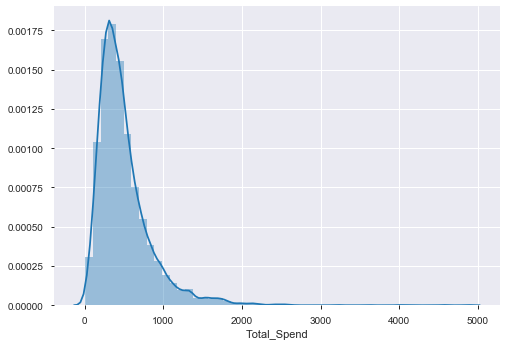

In [12]:
# Check normal distribution
sns.distplot(data.Total_Spend)

In [13]:
# Normalising by log
data['log_Total_Spend']=np.log(data['Total_Spend'])

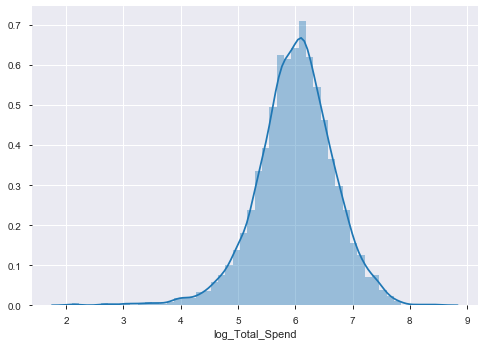

In [14]:
sns.distplot(data.log_Total_Spend)

In [15]:
numeric_var_names=[key for key in dict(data.dtypes) if dict(data.dtypes)[key] in ['float64', 'int64', 'float32', 'int32']]
cat_var_names=[key for key in dict(data.dtypes) if dict(data.dtypes)[key] in ['object', 'O']]

In [16]:
numeric_var_names

['region',
 'townsize',
 'gender',
 'age',
 'agecat',
 'ed',
 'edcat',
 'jobcat',
 'union',
 'employ',
 'empcat',
 'retire',
 'income',
 'lninc',
 'inccat',
 'debtinc',
 'creddebt',
 'lncreddebt',
 'othdebt',
 'lnothdebt',
 'default',
 'jobsat',
 'marital',
 'spoused',
 'spousedcat',
 'reside',
 'pets',
 'pets_cats',
 'pets_dogs',
 'pets_birds',
 'pets_reptiles',
 'pets_small',
 'pets_saltfish',
 'pets_freshfish',
 'homeown',
 'hometype',
 'address',
 'addresscat',
 'cars',
 'carown',
 'cartype',
 'carvalue',
 'carcatvalue',
 'carbought',
 'carbuy',
 'commute',
 'commutecat',
 'commutetime',
 'commutecar',
 'commutemotorcycle',
 'commutecarpool',
 'commutebus',
 'commuterail',
 'commutepublic',
 'commutebike',
 'commutewalk',
 'commutenonmotor',
 'telecommute',
 'reason',
 'polview',
 'polparty',
 'polcontrib',
 'vote',
 'card',
 'cardtype',
 'cardbenefit',
 'cardfee',
 'cardtenure',
 'cardtenurecat',
 'card2',
 'card2type',
 'card2benefit',
 'card2fee',
 'card2tenure',
 'card2tenureca

In [17]:
cat_var_names       # birthmonth is not important in prediction . So ,we do not use birthmonth

['custid', 'birthmonth']

In [18]:
data_num=data[numeric_var_names]
data_num.head(5)

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,...,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,Total_Spend,log_Total_Spend
0,1,2.0,1,20,2,15,3,1,1,0,...,0,1,1,0,0,0,1,0,149.46,5.007029
1,5,5.0,0,22,2,17,4,2,0,0,...,1,1,1,1,1,0,0,0,77.54,4.350794
2,3,4.0,1,67,6,14,2,2,0,16,...,0,0,0,0,1,0,0,0,359.97,5.886021
3,4,3.0,0,23,2,16,3,2,0,0,...,1,1,1,0,1,1,0,0,359.41,5.884464
4,2,2.0,0,26,3,16,3,2,0,1,...,1,0,1,0,0,0,1,0,507.83,6.230147


### Data Audit Report

In [19]:
# Creating Data audit Report
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.std()/x.mean(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'CV','MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

data_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,CV,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
region,5000.0,0.0,1.500700e+04,3.001400,3.000000,1.421760,2.021402e+00,0.473699,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,4.000000,5.000000,5.000000,5.000000,5.000000
townsize,4998.0,2.0,1.343100e+04,2.687275,3.000000,1.425925,2.033262e+00,0.530621,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,4.000000,5.000000,5.000000,5.000000,5.000000
gender,5000.0,0.0,2.518000e+03,0.503600,1.000000,0.500037,2.500370e-01,0.992925,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
age,5000.0,0.0,2.351280e+05,47.025600,47.000000,17.770338,3.157849e+02,0.377886,18.000000,18.000000,20.000000,23.000000,31.000000,47.000000,62.000000,72.000000,76.000000,79.000000,79.000000
agecat,5000.0,0.0,2.119400e+04,4.238800,4.000000,1.308785,1.712917e+00,0.308763,2.000000,2.000000,2.000000,2.000000,3.000000,4.000000,5.000000,6.000000,6.000000,6.000000,6.000000
ed,5000.0,0.0,7.271500e+04,14.543000,14.000000,3.281083,1.076550e+01,0.225613,6.000000,8.000000,9.000000,10.000000,12.000000,14.000000,17.000000,19.000000,20.000000,21.000000,23.000000
edcat,5000.0,0.0,1.336000e+04,2.672000,2.000000,1.211738,1.468310e+00,0.453495,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,4.000000,4.000000,5.000000,5.000000,5.000000
jobcat,5000.0,0.0,1.376400e+04,2.752800,2.000000,1.737900,3.020296e+00,0.631321,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,4.000000,6.000000,6.000000,6.000000,6.000000
union,5000.0,0.0,7.560000e+02,0.151200,0.000000,0.358280,1.283642e-01,2.369574,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
employ,5000.0,0.0,4.865200e+04,9.730400,7.000000,9.690929,9.391410e+01,0.995944,0.000000,0.000000,0.000000,0.000000,2.000000,7.000000,15.000000,25.000000,31.000000,39.000000,52.000000


In [20]:
num_summary=data_num.apply(var_summary).T
num_summary.to_csv('num_summary.csv')

### Handling Outlier

In [21]:
#Handling Outliers
def outlier_capping(x):
    x = x.clip(upper=x.quantile(0.99))
    x = x.clip(lower=x.quantile(0.01))
    return x

data_num=data_num.apply(outlier_capping)

### Handling Missing

In [22]:
#Handling missings
def Missing_imputation(x):
    x = x.fillna(x.median())
    return x

data_num=data_num.apply(Missing_imputation)

### Final file for analysis

In [23]:
data_new = data_num
data_new.head()

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,...,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,Total_Spend,log_Total_Spend
0,1,2.0,1,20,2,15,3,1,1,0,...,0,1,1,0,0,0,1,0,149.46,5.007029
1,5,5.0,0,22,2,17,4,2,0,0,...,1,1,1,1,1,0,0,0,77.54,4.350794
2,3,4.0,1,67,6,14,2,2,0,16,...,0,0,0,0,1,0,0,0,359.97,5.886021
3,4,3.0,0,23,2,16,3,2,0,0,...,1,1,1,0,1,1,0,0,359.41,5.884464
4,2,2.0,0,26,3,16,3,2,0,1,...,1,0,1,0,0,0,1,0,507.83,6.230147


In [24]:
# correlation matrix (ranges from 1 to -1)
corr=data_new.corr()
corr.to_csv('corr.csv')
corr

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,...,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,Total_Spend,log_Total_Spend
region,1.000000,0.414026,-0.012810,-0.026525,-0.018455,0.013850,0.015710,-0.004717,-0.013768,-0.010204,...,0.020596,0.007504,0.026391,0.036622,0.012312,-0.013004,0.005899,0.005694,0.042694,0.039216
townsize,0.414026,1.000000,0.009576,-0.075399,-0.069017,0.002968,0.003744,-0.010768,-0.019846,-0.059221,...,0.002639,0.005333,0.007898,-0.000562,-0.028756,-0.006252,-0.010070,-0.007230,-0.008651,0.006132
gender,-0.012810,0.009576,1.000000,-0.010186,-0.007427,-0.000777,-0.002673,-0.016470,0.000311,-0.011756,...,-0.006963,-0.021319,0.001164,0.009167,-0.020837,0.018058,0.001385,-0.009685,-0.077512,-0.078605
age,-0.026525,-0.075399,-0.010186,1.000000,0.969879,-0.093966,-0.081129,0.037709,0.011206,0.705515,...,-0.133284,-0.217524,-0.235226,-0.042090,0.365204,0.015140,0.013175,-0.026231,0.031680,0.007270
agecat,-0.018455,-0.069017,-0.007427,0.969879,1.000000,-0.078331,-0.064124,0.032554,0.004465,0.679902,...,-0.123192,-0.208690,-0.223387,-0.029310,0.348275,0.010039,0.010467,-0.014860,0.051619,0.030192
ed,0.013850,0.002968,-0.000777,-0.093966,-0.078331,1.000000,0.966489,-0.072855,0.000273,-0.214669,...,0.435623,0.369831,0.377019,0.276163,-0.073510,-0.117333,0.073750,0.107912,0.100943,0.098077
edcat,0.015710,0.003744,-0.002673,-0.081129,-0.064124,0.966489,1.000000,-0.069002,-0.003240,-0.199709,...,0.414619,0.357481,0.361191,0.273646,-0.068420,-0.112653,0.070172,0.106223,0.098842,0.094717
jobcat,-0.004717,-0.010768,-0.016470,0.037709,0.032554,-0.072855,-0.069002,1.000000,0.084778,0.416234,...,-0.037929,-0.026888,-0.050278,0.008409,0.090861,0.000137,0.002888,-0.008415,0.002436,-0.010592
union,-0.013768,-0.019846,0.000311,0.011206,0.004465,0.000273,-0.003240,0.084778,1.000000,0.035272,...,0.006489,-0.005895,0.006765,0.024516,0.007508,-0.010492,0.006431,0.004479,0.011456,0.021191
employ,-0.010204,-0.059221,-0.011756,0.705515,0.679902,-0.214669,-0.199709,0.416234,0.035272,1.000000,...,-0.162028,-0.198838,-0.218677,-0.040587,0.368778,0.039085,0.014410,-0.029312,0.091386,0.069522


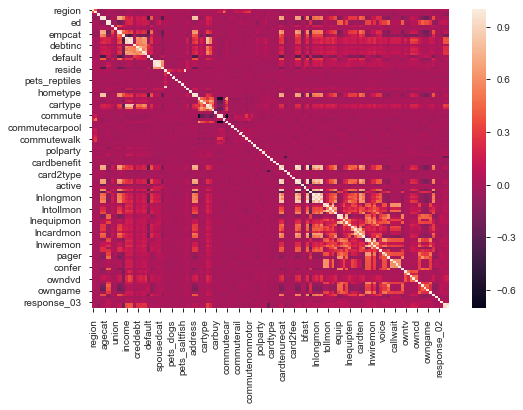

In [25]:
# visualize correlation matrix in Seaborn using a heatmap
sns.heatmap(data_new.corr())

#### Dropping columns based on data audit report
        - Based on low variance (near zero variance)
        - High missings (>25% missings)
        - High correlations between two numerical variables

In [26]:
# Low variance
data_new.drop(columns=['commutemotorcycle','commutepublic','commutenonmotor'],axis=1,inplace=True)

In [27]:
# High missing
data_new.drop(columns=['lncardten'],axis=1,inplace=True)

In [28]:
# High correlation
data_new.drop(columns=['response_01','commutecat'],axis=1,inplace=True)

In [29]:
data_new.shape

(5000, 122)

#### Feature Selection based on importance using F-Regression

In [30]:
# Feature Selection based on importance
features = data_new[data_new.columns.difference(['log_Total_Spend','Total_Spend'])]
target = data_new['log_Total_Spend']
F_values, p_values  = f_regression(features, target )

In [31]:
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(features.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results.loc[80:]

,Variable,F_Value,P_Value
80,owndvd,138.282716,0.000
81,ownfax,19.784973,0.000
82,owngame,8.693023,0.003
83,ownipod,8.424830,0.004
84,ownpc,9.851560,0.002
85,ownpda,24.646407,0.000
86,owntv,36.512224,0.000
87,ownvcr,125.995381,0.000
88,pager,16.789264,0.000
89,pets,0.112238,0.738


In [32]:
f_reg_results.sort_values(by=['P_Value'])
f_reg_results.P_Value = pd.to_numeric(f_reg_results.P_Value)
f_reg_results_new=f_reg_results[f_reg_results.P_Value<=0.1]
f_reg_results_new

,Variable,F_Value,P_Value
1,address,11.355096,0.001
2,addresscat,27.886843,0.000
4,agecat,4.560250,0.033
5,bfast,4.065689,0.044
7,callid,15.603747,0.000
8,callwait,16.065681,0.000
11,carcatvalue,223.075088,0.000
12,card,298.331858,0.000
13,card2,29.990236,0.000
16,card2tenure,16.301730,0.000


#### Variable Reduction using Recursive Feature Elimination

In [33]:
ligreg = LinearRegression()
rfe = RFE(ligreg, 15)
rfe = rfe.fit(features, target )
print(rfe.support_)
print(rfe.ranking_)

[False False False False False False False False False False False False
  True  True False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False  True False False False False False
 False False False False  True False False False False False False False
 False  True False  True False  True False False False False False  True
 False False False False False False False False  True  True False False
 False False  True False False False False False False False  True  True
 False False False False False False False False  True False False False
 False False False False False False False  True False False False False]
[ 19  73  29  72  49  80  20  34  97   6  25  23   1   1  75   2  93  65
  78  99  41 100 103  94   8  77  22  70  55  90  17  79   9  24  15  16
  38  89  50  33  86  95   1  11  81  32  48  96  46  47 102  68   1  28
  27  85  37 105  12  31  44   1  51   1  36   1  

In [34]:
feature_map = [(i, v) for i, v in itertools.zip_longest(features.columns, rfe.get_support())]

feature_map

#Alternative of capturing the important variables
RFE_features=features.columns[rfe.get_support()]

selected_features_from_rfe = features[RFE_features]

In [35]:
RFE_features

Index(['card', 'card2', 'default', 'gender', 'lncardmon', 'lnequipmon',
       'lninc', 'lnwiremon', 'owndvd', 'ownfax', 'owntv', 'pets_reptiles',
       'pets_saltfish', 'response_03', 'voice'],
      dtype='object')

#### Variable reduction using Select K-Best technique

In [36]:
X_new = SelectKBest(f_classif, k=15).fit(features, target )

In [37]:
X_new.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False,  True,
        True, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False,  True,  True,  True,  True, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [38]:
X_new.scores_

array([0.99558822, 0.92536224, 0.96810654, 0.90102018, 0.97085501,
       1.08477987, 1.04965806, 0.96246007, 0.94495912, 0.97175901,
       1.00279754, 1.08036098, 1.10262509, 1.19796941, 1.15461919,
       1.10060702, 1.02745464, 1.09267391, 0.90447528, 1.01883609,
       0.96917035, 0.96847512, 0.98360157, 1.01073485, 1.03350843,
       0.95537703, 1.06514188, 1.11380553, 1.01612211, 1.03295509,
       1.12647526, 1.0161885 , 1.10381263, 0.95756014, 0.98967281,
       1.08831692, 1.00918474, 1.07587409, 0.96001115, 0.94425906,
       1.0968984 , 1.08891051, 1.38527749, 1.0836507 , 1.23246133,
       1.21112998, 1.05898102, 0.89683123, 1.04516152, 0.9505109 ,
       0.81683679, 0.89335496, 1.03391763, 0.99849439, 0.95652301,
       0.97615846, 1.27823138, 0.87840249, 1.08031759, 0.99283896,
       0.91835811, 1.04651155, 1.23196921, 0.82458932, 1.14113741,
       1.12062586, 1.08425725, 1.16052171, 1.16172981, 1.18947344,
       1.37732299, 0.89692194, 1.34423878, 1.10621556, 1.10025

In [39]:
feature_map = [(i, v) for i, v in itertools.zip_longest(features.columns, X_new.get_support())]

feature_map

#Alternative of capturing the important variables
KBest_features=features.columns[X_new.get_support()]

selected_features_from_KBest = features[KBest_features]

In [40]:
KBest_features

Index(['card2', 'card2benefit', 'default', 'ed', 'edcat', 'inccat',
       'lncreddebt', 'lnlongten', 'lnothdebt', 'lntollmon', 'lntollten',
       'lnwireten', 'ownpda', 'pets_saltfish', 'response_03'],
      dtype='object')

#### Variance Inflation Factor assessment

In [41]:
X = pd.concat([features,target], axis=1)
features = "+".join(data_new.columns.difference(['log_Total_Spend','Total_Spend']))
X.head()

,active,address,addresscat,age,agecat,bfast,callcard,callid,callwait,carbought,...,tollmon,tollten,townsize,union,voice,vote,wireless,wiremon,wireten,log_Total_Spend
0,0,0,1,20,2,3,1,0,1,0,...,29.0,161.05,2.0,1,1,1,0,0.00,0.00,5.007029
1,1,2,1,22,2,1,1,1,0,0,...,0.0,0.00,5.0,0,1,0,1,45.65,1683.55,4.350794
2,0,30,5,67,6,3,1,0,0,0,...,0.0,0.00,4.0,0,0,0,0,0.00,0.00,5.886021
3,1,3,2,23,2,1,1,0,0,0,...,0.0,0.00,3.0,0,0,0,0,0.00,0.00,5.884464
4,1,3,2,26,3,3,1,1,1,0,...,16.5,387.70,2.0,0,1,0,1,19.05,410.80,6.230147


In [42]:
features

'active+address+addresscat+age+agecat+bfast+callcard+callid+callwait+carbought+carbuy+carcatvalue+card+card2+card2benefit+card2fee+card2tenure+card2tenurecat+card2type+cardbenefit+cardfee+cardmon+cardten+cardtenure+cardtenurecat+cardtype+carown+cars+cartype+carvalue+churn+commute+commutebike+commutebus+commutecar+commutecarpool+commuterail+commutetime+commutewalk+confer+creddebt+debtinc+default+ebill+ed+edcat+empcat+employ+equip+equipmon+equipten+forward+gender+homeown+hometype+hourstv+inccat+income+internet+jobcat+jobsat+lncardmon+lncreddebt+lnequipmon+lnequipten+lninc+lnlongmon+lnlongten+lnothdebt+lntollmon+lntollten+lnwiremon+lnwireten+longmon+longten+marital+multline+news+othdebt+owncd+owndvd+ownfax+owngame+ownipod+ownpc+ownpda+owntv+ownvcr+pager+pets+pets_birds+pets_cats+pets_dogs+pets_freshfish+pets_reptiles+pets_saltfish+pets_small+polcontrib+polparty+polview+reason+region+reside+response_02+response_03+retire+spoused+spousedcat+telecommute+tenure+tollfree+tollmon+tollten+townsi

In [43]:
a,b = dmatrices(formula_like='log_Total_Spend ~ '+ 'address+addresscat+agecat+bfast+callid+callwait+carcatvalue+card+card2+card2tenure+card2tenurecat+cardten+cardtenure+cardtenurecat+carown+carvalue+commutebike+confer+creddebt+ebill+ed+edcat+empcat+employ+equip+equipmon+equipten+forward+gender+homeown+hourstv+inccat+income+internet+jobsat+lncreddebt+lnequipmon+lnequipten+lninc+lnlongmon+lnlongten+lnothdebt+lntollmon+lntollten+lnwiremon+lnwireten+longmon+longten+multline+news+othdebt+owncd+owndvd+ownfax+owngame+ownipod+ownpc+ownpda+owntv+ownvcr+pager+polcontrib+region+response_02+response_03+retire+spoused+spousedcat+tenure+tollfree+tollmon+tollten+voice+vote+wireless+wiremon+wireten', data = data_new, return_type='dataframe')

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif["features"] = b.columns

print(vif)

      VIF Factor        features
0   39085.376807       Intercept
1       9.368387         address
2      10.324385      addresscat
3       5.276725          agecat
4       1.057179           bfast
5       2.241930          callid
6       2.194939        callwait
7       7.717703     carcatvalue
8       1.194186            card
9       1.206305           card2
10     33.776246     card2tenure
11     18.163440  card2tenurecat
12      2.600728         cardten
13     23.325960      cardtenure
14     12.055514   cardtenurecat
15      2.665659          carown
16     11.919051        carvalue
17      1.027445     commutebike
18      2.274967          confer
19      3.641043        creddebt
20      1.875387           ebill
21     16.167050              ed
22     15.485784           edcat
23      7.726317          empcat
24      7.699858          employ
25    606.009530           equip
26    739.432748        equipmon
27     22.618235        equipten
28      2.164491         forward
29      1.

### Final list of variable selected for the model building from above steps

address, addresscat, agecat, bfast, callid, callwait, carcatvalue, card, card2, card2tenure, card2tenurecat, cardten, cardtenure, cardtenurecat, carown, carvalue, commutebike, confer, creddebt, ebill, ed, edcat, empcat, employ, equip, equipmon, equipten, forward, gender, homeown, hourstv, inccat, income, internet, jobsat, lncreddebt, lnequipmon, lnequipten, lninc, lnlongmon, lnlongten, lnothdebt, lntollmon, lntollten, lnwiremon, lnwireten, longmon, longten, multline, news, othdebt, owncd, owndvd, ownfax, owngame, ownipod, ownpc, ownpda, owntv, ownvcr, pager, polcontrib, region, response_02, response_03, retire, spoused, spousedcat, tenure, tollfree, tollmon, tollten, voice, vote, wireless, wiremon, wireten

In [44]:
feature_columns=['address','age','addresscat','agecat','bfast','callid','callwait','carcatvalue','card','card2','card2tenure',
'card2tenurecat','cardten','cardtenure','cardtenurecat','carown','carvalue','commutebike','confer','creddebt','ebill','ed',
'edcat','empcat','employ','equip','equipmon','equipten','forward','gender','homeown','hourstv','inccat','income','internet',
'jobsat','lncreddebt','lnequipmon','lnequipten','lninc','lnlongmon','lnlongten','lnothdebt','lntollmon','lntollten',
 'lnwiremon','lnwireten','longmon','longten','multline','news','othdebt','owncd','owndvd','ownfax','owngame','ownipod','ownpc',
'ownpda','owntv','ownvcr','pager','polcontrib','region','response_02','response_03','retire','spoused','spousedcat','tenure',
'tollfree','tollmon','tollten','voice','vote','wireless','wiremon','wireten']

In [45]:
data=pd.concat([data_new[feature_columns],data_new['log_Total_Spend']],axis=1)

### Apply Transformation

In [46]:
y=data_new.log_Total_Spend
def corr_check(x):
    c1=y.corr(x)
    c2=y.corr(np.log(x+1))
    c3=y.corr(np.sqrt(x))
    c4=y.corr(np.square(x))
    c5=y.corr(np.cbrt(x))
    res=pd.Series([c1,c2,c3,c4,c5],index=['x','log_x','sqrt_x','sq_x','cbrt_x'])
    return res

corr_advanced=data.apply(corr_check)
corr_advanced=corr_advanced.T

In [47]:
corr_advanced

,x,log_x,sqrt_x,sq_x,cbrt_x
address,0.047611,0.090261,0.074661,0.013326,0.084797
age,0.007270,0.040056,0.024209,-0.024673,0.029830
addresscat,0.074489,0.084576,0.081751,0.059356,0.083928
agecat,0.030192,0.049023,0.042262,0.006428,0.046194
bfast,0.028510,0.024890,0.025725,0.033298,0.024768
callid,0.055788,0.055788,0.055788,0.055788,0.055788
callwait,0.056605,0.056605,0.056605,0.056605,0.056605
carcatvalue,0.206702,NaN,0.340164,0.305475,0.064590
card,-0.237335,-0.271705,-0.262961,-0.189167,-0.271240
card2,-0.077231,-0.097444,-0.092102,-0.053450,-0.097224


#### Choose variable transformation according to higher correlation value.

Variables to not transform : 
callid, callwait, commutebike, confer, ebill, ed, edcat, equip, forward, gender, homeown, multline, news, owncd, owndvd, ownfax, owngame, ownipod, ownpc, ownpda, owntv, ownvcr, pager, polcontrib, response_02, response_03, retire, tollfree, tollten, voice, vote, wireless, wiremon, wireten, lncreddebt, lnlongten, lnothdebt

Variables to transform to log : 
address, addresscat, agecat, card, card2, card2tenurecat, cardtenure, cardtenurecat, empcat, employ, longten, othdebt, tenure, hourstv, income, lnlongmon, longmon, longten

In [48]:
data['log_address']=data['address'].apply(lambda x:np.log(x+1))
data['log_addresscat']=data['addresscat'].apply(lambda x:np.log(x+1))
data['log_agecat']=data['agecat'].apply(lambda x:np.log(x+1))
data['log_card']=data['card'].apply(lambda x:np.log(x+1))
data['log_card2']=data['card2'].apply(lambda x:np.log(x+1))
data['log_card2tenurecat']=data['card2tenurecat'].apply(lambda x:np.log(x+1))
data['log_cardtenure']=data['cardtenure'].apply(lambda x:np.log(x+1))
data['log_cardtenurecat']=data['cardtenurecat'].apply(lambda x:np.log(x+1))
data['log_empcat']=data['empcat'].apply(lambda x:np.log(x+1))
data['log_employ']=data['employ'].apply(lambda x:np.log(x+1))
data['log_longten']=data['longten'].apply(lambda x:np.log(x+1))
data['log_othdebt']=data['othdebt'].apply(lambda x:np.log(x+1))
data['log_tenure']=data['tenure'].apply(lambda x:np.log(x+1))
data['log_hourstv']=data['hourstv'].apply(lambda x:np.log(x+1))
data['log_income']=data['income'].apply(lambda x:np.log(x+1))
data['log_lnlongmon']=data['lnlongmon'].apply(lambda x:np.log(x+1))
data['log_longmon']=data['longmon'].apply(lambda x:np.log(x+1))
data['log_longten']=data['longten'].apply(lambda x:np.log(x+1))

Variables to transform to square root : 
carcatvalue, cardten, carown, carvalue, spoused, spousedcat, inccat, jobsat

In [49]:
data['sqrt_carcatvalue']=data['carcatvalue'].apply(lambda x:np.sqrt(x))
data['sqrt_cardten']=data['cardten'].apply(lambda x:np.sqrt(x))
data['sqrt_carown']=data['carown'].apply(lambda x:np.sqrt(x))
data['sqrt_carvalue']=data['carvalue'].apply(lambda x:np.sqrt(x))
data['sqrt_spoused']=data['spoused'].apply(lambda x:np.sqrt(x))
data['sqrt_spousedcat']=data['spousedcat'].apply(lambda x:np.sqrt(x))
data['sqrt_inccat']=data['inccat'].apply(lambda x:np.sqrt(x))
data['sqrt_jobsat']=data['jobsat'].apply(lambda x:np.sqrt(x))

variables to transform to square : 
bfast, equipmon, equipten, tollmon, internet, lnequipmon, lnequipten, lntollmon, lntollten, lnwiremon

In [50]:
data['sq_bfast']=data['bfast'].apply(lambda x:np.square(x))
data['sq_equipmon']=data['equipmon'].apply(lambda x:np.square(x))
data['sq_equipten']=data['equipten'].apply(lambda x:np.square(x))
data['sq_tollmon']=data['tollmon'].apply(lambda x:np.square(x))
data['sq_internet']=data['internet'].apply(lambda x:np.square(x))
data['sq_lnequipmon']=data['lnequipmon'].apply(lambda x:np.square(x))
data['sq_lnequipten']=data['lnequipten'].apply(lambda x:np.square(x))
data['sq_lntollmon']=data['lntollmon'].apply(lambda x:np.square(x))
data['sq_lntollten']=data['lntollten'].apply(lambda x:np.square(x))
data['sq_lnwiremon']=data['lnwiremon'].apply(lambda x:np.square(x))

variables to transform to cube root : 
card2tenure, creddebt, region, lninc

In [51]:
data['cbrt_card2tenure']=data['card2tenure'].apply(lambda x:np.cbrt(x))
data['cbrt_creddebt']=data['creddebt'].apply(lambda x:np.cbrt(x))
data['cbrt_region']=data['region'].apply(lambda x:np.cbrt(x))
data['cbrt_lninc']=data['lninc'].apply(lambda x:np.cbrt(x))

### Building a linear regression model

In [76]:
train, test = train_test_split( data,test_size = 0.3,random_state = 1234 )

In [77]:
print(len( train))
print(len( test))

3500
1500


In [78]:
lm = smf.ols("log_Total_Spend~callid+callwait+commutebike+confer+ebill+ed+edcat+equip+forward+gender+homeown+multline+news+owncd+owndvd+ownfax+owngame+ownipod+ownpc+ownpda+owntv+ownvcr+pager+polcontrib+response_02+response_03+retire+tollfree+tollten+voice+vote+wireless+wiremon+wireten+lncreddebt+lnlongten+lnothdebt+log_address+log_addresscat+log_agecat+log_card+log_card2+log_card2tenurecat+log_cardtenure+log_cardtenurecat+log_empcat+log_employ+log_longten+log_othdebt+log_tenure+log_hourstv+log_income+log_lnlongmon+log_longmon+log_longten+sqrt_carcatvalue+sqrt_cardten+sqrt_carown+sqrt_carvalue+sqrt_spoused+sqrt_spousedcat+sqrt_inccat+sqrt_jobsat+sq_bfast+sq_equipmon+sq_equipten+sq_tollmon+sq_internet+sq_lnequipmon+sq_lnequipten+sq_lntollmon+sq_lntollten+sq_lnwiremon+cbrt_card2tenure+cbrt_creddebt+cbrt_region+cbrt_lninc", data=train).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:        log_Total_Spend   R-squared:                       0.343
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     10.03
Date:                Sat, 03 Aug 2019   Prob (F-statistic):           7.06e-88
Time:                        05:21:06   Log-Likelihood:                -1189.2
No. Observations:                1540   AIC:                             2532.
Df Residuals:                    1463   BIC:                             2944.
Df Model:                          76                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              8.5154      2

#### Reduce the variables to 15 by p-value.

In [79]:
lm = smf.ols("log_Total_Spend~gender+ownvcr+voice+wireten+log_card+log_card2+log_cardtenure+log_longten+log_tenure+log_income+log_lnlongmon+log_longten+sqrt_cardten+sqrt_spoused+sqrt_spousedcat+sq_internet", data=train).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:        log_Total_Spend   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     51.62
Date:                Sat, 03 Aug 2019   Prob (F-statistic):          1.23e-126
Time:                        05:21:08   Log-Likelihood:                -1341.6
No. Observations:                1706   AIC:                             2715.
Df Residuals:                    1690   BIC:                             2802.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           6.7170      0.280     

### Final list of variable selected for the model building from above steps

gender, ownvcr, voice, wireten, log_card, log_card2, log_cardtenure, log_longten, log_tenure, log_income, log_lnlongmon, sqrt_cardten, sqrt_spoused, sqrt_spousedcat, sq_internet

In [80]:
lm.predict(train)

4735    6.240865
1796    6.435741
479          NaN
2524    6.411940
1565         NaN
1893         NaN
3137         NaN
3306    5.832405
2132    6.743468
3749    5.867164
763     6.099415
2386    5.400646
3349    6.374780
624          NaN
2545         NaN
1682         NaN
2813    6.368644
2652    5.914850
789     5.913669
4811    5.923576
2438    5.254963
2363         NaN
833          NaN
4252    6.375884
2551         NaN
4331         NaN
4781         NaN
4333         NaN
4899         NaN
4833    5.797747
          ...   
4467    6.312850
2956         NaN
1299    5.638907
1282         NaN
3       5.894226
2384    6.205082
3915         NaN
4841         NaN
2791    6.364401
1530    5.635695
4006         NaN
3824         NaN
3503         NaN
2558    6.157077
246     6.982531
2431         NaN
969     5.909980
3408    6.212943
3397    5.526575
2168         NaN
2490         NaN
1182         NaN
30           NaN
1257         NaN
279     5.814496
664          NaN
3276    5.727449
1318         N

#### Predict the Y (Scoring the train & test and validate the results)

In [81]:
train['pred_ln_spend'] = lm.predict(train)
test['pred_ln_spend']  = lm.predict(test)

In [82]:
train['actual_spend'] = np.exp(train.log_Total_Spend)
test['actual_spend'] = np.exp(test.log_Total_Spend)

train['pred_spend'] = np.exp(train.pred_ln_spend)
test['pred_spend'] = np.exp(test.pred_ln_spend)

### Accuracy Metrics

In [83]:
#Train Data
MAPE_train = np.mean(np.abs(train.actual_spend - train.pred_spend)/train.actual_spend )
print(MAPE_train)

#Test Data
MAPE_test = np.mean(np.abs(test.actual_spend - test.pred_spend)/test.actual_spend )
print(MAPE_test)

0.4826532206513525
0.5122804561237203


In [84]:
# mean squared error
mse = np.sum((train.pred_spend - train.actual_spend)**2)
print('mean squared error : ',mse)

# root mean squared error
rmse = np.sqrt(mse/train.pred_spend.shape[0])
print('root mean squared error : ',rmse)

mean squared error :  126559922.47006819
root mean squared error :  190.15777093926746


In [85]:
# sum of square of residuals
ssr = np.sum((train.pred_spend - train.actual_spend)**2)
print('sum of square of residuals : ',ssr)

#  total sum of squares
sst = np.sum((train.actual_spend - np.mean(train.actual_spend))**2)
print('total sum of squares : ',sst)

# R2 score
r2_score = 1 - (ssr/sst)
print('R2 score : ',r2_score)

sum of square of residuals :  126559922.47006819
total sum of squares :  378619286.32325196
R2 score :  0.6657330277623108


### Decile Analysis for Linear Regression

In [86]:
train.columns

Index(['address', 'age', 'addresscat', 'agecat', 'bfast', 'callid', 'callwait',
       'carcatvalue', 'card', 'card2',
       ...
       'sq_lntollmon', 'sq_lntollten', 'sq_lnwiremon', 'cbrt_card2tenure',
       'cbrt_creddebt', 'cbrt_region', 'cbrt_lninc', 'pred_ln_spend',
       'actual_spend', 'pred_spend'],
      dtype='object', length=121)

In [87]:
### Decile Analysis
#Decile analysis for validation of models - Business validation

train['Deciles']=pd.qcut(train.pred_spend,10, labels=False)
test['Deciles']=pd.qcut(test.pred_spend,10, labels=False)

In [88]:
# Decile Analysis for train data
Predicted_avg = train[['Deciles','pred_spend']].groupby(train.Deciles).mean().sort_index(ascending=False)['pred_spend']
Actual_avg = train[['Deciles','actual_spend']].groupby(train.Deciles).mean().sort_index(ascending=False)['actual_spend']

Decile_analysis_train = pd.concat([Predicted_avg, Actual_avg], axis=1)

Decile_analysis_train

,pred_spend,actual_spend
Deciles,,
9.0,797.979860,863.847378
8.0,607.716289,739.206887
7.0,523.542251,592.816036
6.0,470.812447,551.417647
5.0,428.393660,470.302689
4.0,389.296645,410.065927
3.0,355.807562,418.416009
2.0,323.642908,356.811089
1.0,283.992973,335.685820


In [89]:
# Decile Analysis for test data
Predicted_avg = test[['Deciles','pred_spend']].groupby(test.Deciles).mean().sort_index(ascending=False)['pred_spend']
Actual_avg = test[['Deciles','actual_spend']].groupby(test.Deciles).mean().sort_index(ascending=False)['actual_spend']

Decile_analysis_test = pd.concat([Predicted_avg, Actual_avg], axis=1)

Decile_analysis_test

,pred_spend,actual_spend
Deciles,,
9.0,767.751407,848.906981
8.0,591.551469,634.351191
7.0,519.387746,583.717000
6.0,473.416060,528.697101
5.0,435.619515,507.510466
4.0,396.600084,426.674857
3.0,359.975389,392.102029
2.0,326.436796,368.223429
1.0,290.800292,373.720435


In [90]:
Decile_analysis_train.to_csv('Decile_analysis_train.csv')

Decile_analysis_test.to_csv('Decile_analysis_test.csv')

# Decision Trees (DT)

In [91]:
features = data_new[data_new.columns.difference(['log_Total_Spend','Total_Spend'])]
target = data_new['log_Total_Spend']

In [92]:
train_X, test_X, train_y, test_y = train_test_split( features,target,test_size = 0.3,random_state = 56789)

In [93]:
from sklearn.tree import DecisionTreeRegressor  
from sklearn.model_selection import cross_val_predict

In [94]:
regressor = DecisionTreeRegressor(max_depth=5,random_state=0)  
regressor.fit(train_X, train_y) 

DecisionTreeRegressor(criterion='mse', max_depth=5, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=0, splitter='best')

In [95]:
y_pred = regressor.predict(test_X) 

In [96]:
dt=pd.DataFrame({'Actual':test_y, 'Predicted':y_pred})  
dt

,Actual,Predicted
4133,6.289808,6.161825
3771,7.348768,6.699896
26,6.307497,6.161825
2049,5.730652,5.782489
3385,6.283294,7.059800
2240,5.386740,5.258174
671,6.410520,6.250238
3049,6.566293,6.158166
3543,6.103677,5.982941
522,6.106310,5.782489


In [97]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.42490817441077905
Mean Squared Error: 0.2907487294410937
Root Mean Squared Error: 0.5392112104186019


In [98]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",regressor.score(train_X, train_y))
print("R-squared for Test:",regressor.score(test_X, test_y))

R-squared for Train: 0.35763263239988463
R-squared for Test: 0.25023451258686147


## Tuning a regression tree

In [99]:
# list of values to try
max_depth_range = range(2, 11)

# list to store the average RMSE for each value of max_depth
RMSE_Scores = []
MSE_Scores = []

# use LOOCV with each value of max_depth
for depth in max_depth_range:
    treereg = DecisionTreeRegressor(max_depth=depth, random_state=345)
    
    MSE_scores = cross_val_score(treereg, train_X, train_y, cv=14, scoring='neg_mean_squared_error')
    
    RMSE_Scores.append(np.mean(np.sqrt(-MSE_scores)))
    MSE_Scores.append(MSE_scores)

In [100]:
print (RMSE_Scores)

[0.5768190828227224, 0.5541090090202114, 0.5452670489475946, 0.5516001725078172, 0.5635161116927387, 0.5808759583064271, 0.604555294031259, 0.6230846896955127, 0.6512872724350086]


Text(0, 0.5, 'RMSE (lower is better)')

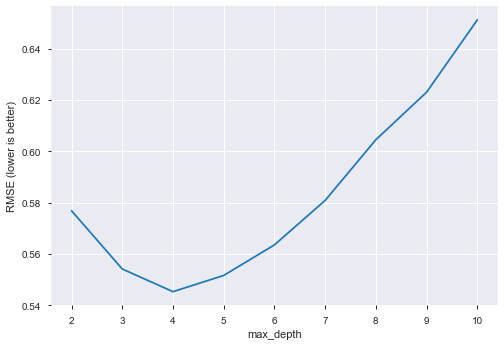

In [101]:
# plot max_depth (x-axis) versus RMSE (y-axis)
plt.plot(max_depth_range, RMSE_Scores)
plt.xlabel('max_depth')
plt.ylabel('RMSE (lower is better)')

### Building Final Decision Tree Model

In [102]:
# max_depth=4 was best, so fit a tree using that parameter
treereg = DecisionTreeRegressor(max_depth=4, random_state=345)
treereg.fit(train_X, train_y)

DecisionTreeRegressor(criterion='mse', max_depth=4, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=345, splitter='best')

In [103]:
treereg.feature_importances_

array([0.        , 0.        , 0.        , 0.0054843 , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.38767381, 0.16679622, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.31763493, 0.        , 0.        ,
       0.        , 0.        , 0.01452147, 0.        , 0.        ,
       0.10127685, 0.        , 0.        , 0.0042251 , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [104]:
# "Gini importance" of each feature: the (normalized) total reduction of error brought by that feature
pd.DataFrame({'feature':data_new.columns.difference(['log_Total_Spend','Total_Spend']), 'importance':treereg.feature_importances_})

,feature,importance
0,active,0.000000
1,address,0.000000
2,addresscat,0.000000
3,age,0.005484
4,agecat,0.000000
5,bfast,0.000000
6,callcard,0.000000
7,callid,0.000000
8,callwait,0.000000
9,carbought,0.000000


In [105]:
### K-FOLD CROSS VALIDATION
scores = cross_val_score(treereg, train_X, train_y, cv=10, scoring='r2')
scores

array([0.26188844, 0.2770951 , 0.29338995, 0.30006066, 0.26294643,
       0.32820485, 0.25555852, 0.35506264, 0.31382171, 0.28661763])

In [106]:
round( np.mean( cross_val_score( treereg,
                              train_X,
                              train_y,
                              scoring = 'r2',
                              cv = 10 ) ), 2 )

0.29

## Creating a tree diagram

In [107]:
# create a Graphviz file
from sklearn.tree import export_graphviz
export_graphviz(treereg, out_file='tree_vehicles.png', feature_names=data_new.columns.difference(['log_Total_Spend','Total_Spend']))

## Making predictions for the testing data

In [108]:
pred = treereg.predict(train_X) 
y_pred = treereg.predict(test_X) 

In [109]:
# use fitted model to make predictions on testing data
dt=pd.DataFrame({'Actual':test_y, 'Predicted':y_pred})  
dt

,Actual,Predicted
4133,6.289808,6.176941
3771,7.348768,6.757886
26,6.307497,6.176941
2049,5.730652,5.726945
3385,6.283294,6.992413
2240,5.386740,5.308291
671,6.410520,6.260539
3049,6.566293,6.019597
3543,6.103677,6.019597
522,6.106310,5.726945


In [110]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.4228854653517302
Mean Squared Error: 0.2850872053802486
Root Mean Squared Error: 0.5339355816765246


In [111]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",treereg.score(train_X, train_y))
print("R-squared for Test:",treereg.score(test_X, test_y))

R-squared for Train: 0.3314733294905372
R-squared for Test: 0.26483411326315864


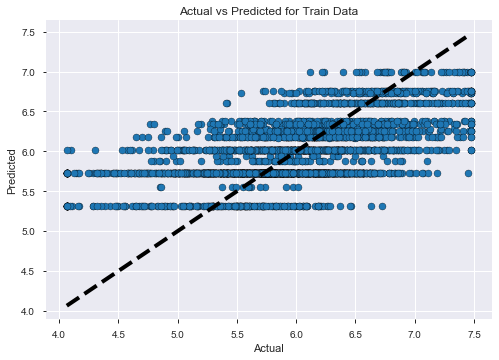

In [112]:
fig, ax = plt.subplots()
ax.scatter(train_y, pred, edgecolors=(0, 0, 0))
ax.plot([train_y.min(), train_y.max()], [train_y.min(), train_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Train Data")
plt.show()

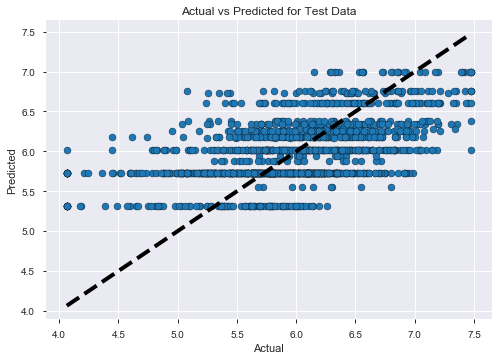

In [113]:
fig, ax = plt.subplots()
ax.scatter(test_y, y_pred, edgecolors=(0, 0, 0))
ax.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Test Data")
plt.show()

# Random Forest (RF)

In [114]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(max_depth=5,n_estimators=20, random_state=0)  
rfr.fit(train_X, train_y)  
y_pred = rfr.predict(test_X) 

In [115]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.41548404816005
Mean Squared Error: 0.2758969692308619
Root Mean Squared Error: 0.5252589544509088


In [116]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",rfr.score(train_X, train_y))
print("R-squared for Test:",rfr.score(test_X, test_y))

R-squared for Train: 0.3776373394909172
R-squared for Test: 0.28853334627178584


### Tuning a Random Forest

In [117]:
from sklearn.model_selection import GridSearchCV

In [118]:
param_grid={'max_depth': range(3,11),
            'n_estimators': (10, 50, 100)}

In [119]:
# Perform Grid-Search
gsc = GridSearchCV(estimator=RandomForestRegressor(),param_grid=param_grid,cv=5, verbose=0, n_jobs=-1)
    
grid_result = gsc.fit(train_X, train_y)

In [120]:
grid_result.best_score_

0.3123987347542653

In [121]:
grid_result.best_params_

{'max_depth': 4, 'n_estimators': 100}

### Building Final Random Forest Model

In [122]:
rfr = RandomForestRegressor(max_depth=4,n_estimators=100, random_state=0)  
rfr.fit(train_X, train_y)  
pred=rfr.predict(train_X)
y_pred = rfr.predict(test_X) 

In [123]:
# "Gini importance" of each feature: the (normalized) total reduction of error brought by that feature
pd.DataFrame({'feature':data_new.columns.difference(['log_Total_Spend','Total_Spend']), 'importance':rfr.feature_importances_})

,feature,importance
0,active,0.000000
1,address,0.001274
2,addresscat,0.000000
3,age,0.001426
4,agecat,0.000227
5,bfast,0.000058
6,callcard,0.000000
7,callid,0.000000
8,callwait,0.000266
9,carbought,0.000288


In [124]:
### K-FOLD CROSS VALIDATION
scores = cross_val_score(rfr, train_X, train_y, cv=10, scoring='r2')
scores

array([0.28057611, 0.29804574, 0.31830444, 0.31659791, 0.28248648,
       0.33986548, 0.27755167, 0.35881242, 0.33767379, 0.29897722])

In [125]:
round( np.mean( cross_val_score( rfr,
                              train_X,
                              train_y,
                              scoring = 'r2',
                              cv = 10 ) ), 2 )

0.31

In [126]:
dt=pd.DataFrame({'Actual':test_y, 'Predicted':y_pred})  
dt

,Actual,Predicted
4133,6.289808,6.216529
3771,7.348768,6.785909
26,6.307497,6.128495
2049,5.730652,5.715637
3385,6.283294,6.912736
2240,5.386740,5.514887
671,6.410520,6.260506
3049,6.566293,6.041885
3543,6.103677,6.034297
522,6.106310,5.792471


In [127]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.4154945331148881
Mean Squared Error: 0.27585515449666875
Root Mean Squared Error: 0.5252191490194058


In [128]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",rfr.score(train_X, train_y))
print("R-squared for Test:",rfr.score(test_X, test_y))

R-squared for Train: 0.3481002456480984
R-squared for Test: 0.28864117561509417


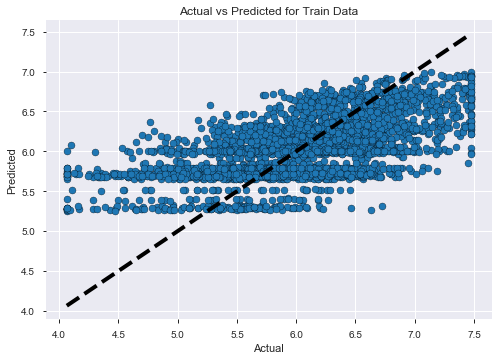

In [129]:
fig, ax = plt.subplots()
ax.scatter(train_y, pred, edgecolors=(0, 0, 0))
ax.plot([train_y.min(), train_y.max()], [train_y.min(), train_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Train Data")
plt.show()

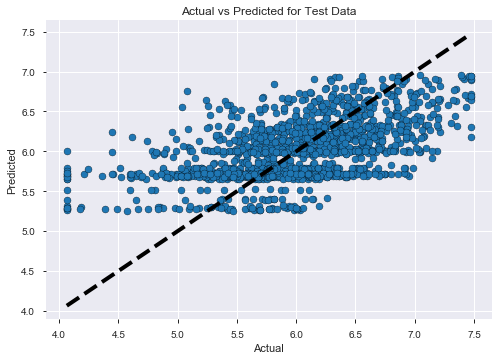

In [130]:
fig, ax = plt.subplots()
ax.scatter(test_y, y_pred, edgecolors=(0, 0, 0))
ax.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Test Data")
plt.show()

# Gradient Boosting (GBM)

In [131]:
from sklearn.ensemble import GradientBoostingRegressor
from numpy.core.umath_tests import inner1d
from sklearn.model_selection import ShuffleSplit

In [132]:
gbrt=GradientBoostingRegressor()
gbrt.fit(train_X, train_y)
y_pred=gbrt.predict(test_X)

In [133]:
#One of the benefits of growing trees is that we can understand how important each of the features are
print(gbrt.feature_importances_)

[1.25746552e-03 4.85658634e-03 6.40243954e-04 9.76797331e-03
 0.00000000e+00 1.22126773e-03 0.00000000e+00 8.47122618e-04
 0.00000000e+00 7.38301650e-04 1.54074716e-03 7.11851840e-04
 2.79693242e-01 1.13688369e-01 4.55928966e-03 0.00000000e+00
 1.74580204e-03 7.15074515e-04 5.44786695e-03 8.06846701e-04
 0.00000000e+00 5.26573132e-03 8.57789854e-03 1.60971014e-03
 0.00000000e+00 4.96299685e-04 0.00000000e+00 4.08406452e-04
 5.59802562e-04 5.68276711e-03 1.17950670e-03 8.24432922e-04
 1.50078720e-03 0.00000000e+00 5.73568436e-04 0.00000000e+00
 3.57166181e-05 5.44144084e-03 0.00000000e+00 0.00000000e+00
 7.66096816e-03 8.59030289e-03 4.51632739e-04 0.00000000e+00
 7.30105912e-03 1.73794214e-04 0.00000000e+00 3.28584008e-03
 0.00000000e+00 2.40229115e-03 3.15275920e-03 5.68530737e-04
 2.87333606e-03 6.30977573e-04 2.84454080e-03 4.44070394e-03
 0.00000000e+00 1.89892498e-01 3.97916077e-03 5.43430010e-03
 9.30637315e-04 6.01019677e-03 1.10973581e-02 1.04956653e-02
 3.26118959e-03 1.492607

In [134]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.4175855998092832
Mean Squared Error: 0.2763260886840496
Root Mean Squared Error: 0.5256672794497006


In [135]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",gbrt.score(train_X, train_y))
print("R-squared for Test:",gbrt.score(test_X, test_y))

R-squared for Train: 0.46400213735350326
R-squared for Test: 0.2874267586124133


### Tuning a Gradient Boosting Model (GBM)

In [136]:
param_grid={'n_estimators' : [100,500],# 100,500,1000],
            'learning_rate' : [0.1,0.01],# 0.02,0.05,0.1],
            'max_depth' : [4,6]}# 5,6]

In [137]:
# Perform Grid-Search
gbr = GridSearchCV(estimator=GradientBoostingRegressor(),param_grid=param_grid,cv=5)
    
grid_result = gbr.fit(train_X, train_y)

In [138]:
grid_result.best_score_

0.31456010411432017

In [139]:
grid_result.best_params_

{'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 500}

### Building Final Gradient Boosting Model

In [140]:
gbrt=GradientBoostingRegressor(n_estimators=500, learning_rate=0.01, max_depth=4)
gbrt.fit(train_X, train_y)
pred=gbrt.predict(train_X)
y_pred=gbrt.predict(test_X)

In [141]:
# "Gini importance" of each feature: the (normalized) total reduction of error brought by that feature
pd.DataFrame({'feature':data_new.columns.difference(['log_Total_Spend','Total_Spend']), 'importance':gbrt.feature_importances_})

,feature,importance
0,active,2.208792e-03
1,address,4.557809e-03
2,addresscat,3.497689e-05
3,age,8.838234e-03
4,agecat,1.627501e-04
5,bfast,9.697837e-04
6,callcard,7.659171e-06
7,callid,0.000000e+00
8,callwait,3.800209e-04
9,carbought,7.113597e-04


In [142]:
# K Fold Cross Validation
scores = cross_val_score(gbrt, train_X, train_y, cv=10, scoring='r2')
scores

array([0.26407573, 0.30988112, 0.30443462, 0.33454043, 0.29471094,
       0.34631206, 0.28291022, 0.36304158, 0.34300865, 0.30073667])

In [143]:
round( np.mean( cross_val_score( gbrt,
                              train_X,
                              train_y,
                              scoring = 'r2',
                              cv = 10 ) ), 2 )

0.31

In [144]:
dt=pd.DataFrame({'Actual':test_y, 'Predicted':y_pred})  
dt

,Actual,Predicted
4133,6.289808,6.227932
3771,7.348768,6.634056
26,6.307497,6.019986
2049,5.730652,5.740126
3385,6.283294,6.934955
2240,5.386740,5.511754
671,6.410520,6.279188
3049,6.566293,6.142341
3543,6.103677,6.016946
522,6.106310,5.830531


In [145]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.41707263110338755
Mean Squared Error: 0.2763074804926909
Root Mean Squared Error: 0.5256495795610331


In [146]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",gbrt.score(train_X, train_y))
print("R-squared for Test:",gbrt.score(test_X, test_y))

R-squared for Train: 0.4667703438005679
R-squared for Test: 0.28747474430676445


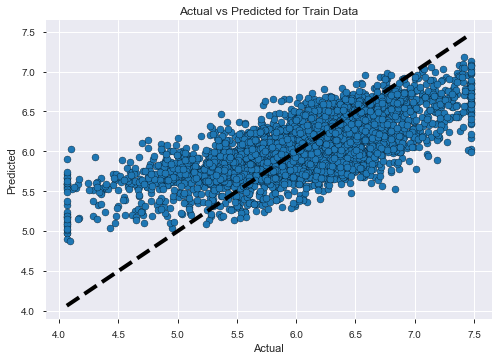

In [147]:
fig, ax = plt.subplots()
ax.scatter(train_y, pred, edgecolors=(0, 0, 0))
ax.plot([train_y.min(), train_y.max()], [train_y.min(), train_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Train Data")
plt.show()

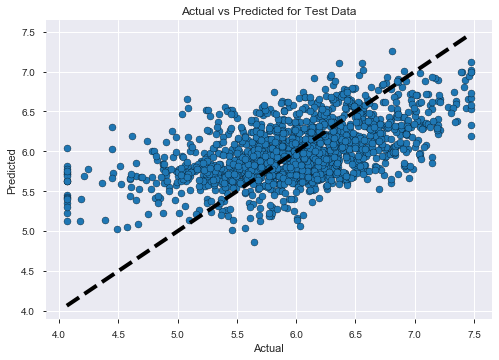

In [148]:
fig, ax = plt.subplots()
ax.scatter(test_y, y_pred, edgecolors=(0, 0, 0))
ax.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Test Data")
plt.show()

# XGBOOST

In [149]:
import xgboost as xgb

In [150]:
xg_reg = xgb.XGBRegressor()
xg_reg.fit(train_X, train_y)
y_pred=xg_reg.predict(test_X)

[05:46:47] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [151]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.41571869433501724
Mean Squared Error: 0.2751709245746279
Root Mean Squared Error: 0.5245673689571511


In [152]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",xg_reg.score(train_X, train_y))
print("R-squared for Test:",xg_reg.score(test_X, test_y))

R-squared for Train: 0.4563088590972631
R-squared for Test: 0.2904056269404286


### Tuning a XGBoost Model

In [153]:
xgb1 = xgb.XGBRegressor()

In [154]:
parameters = {'n_estimators': [100,500],
            'learning_rate': [0.01,0.05,0.1], #so called `eta` value
              'max_depth': [4,5,6]}

In [155]:
xgb_grid = GridSearchCV(xgb1,parameters,cv = 2,n_jobs = 5,verbose=True)

grid_result = xgb_grid.fit(train_X, train_y)

Fitting 2 folds for each of 18 candidates, totalling 36 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  36 out of  36 | elapsed:  9.3min finished


[05:56:59] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [156]:
print(xgb_grid.best_score_)

0.30364552216354995


In [157]:
print(xgb_grid.best_params_)

{'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 500}


### Building Final XGBoost Model

In [158]:
xg_reg = xgb.XGBRegressor(n_estimators=500, learning_rate=0.01, max_depth=4)
xg_reg.fit(train_X, train_y)
pred=xg_reg.predict(train_X)
y_pred=xg_reg.predict(test_X)

[05:59:51] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [159]:
# "Gini importance" of each feature: the (normalized) total reduction of error brought by that feature
pd.DataFrame({'feature':data_new.columns.difference(['log_Total_Spend','Total_Spend']), 'importance':xg_reg.feature_importances_})

,feature,importance
0,active,0.005107
1,address,0.005048
2,addresscat,0.000000
3,age,0.008662
4,agecat,0.000000
5,bfast,0.012963
6,callcard,0.000000
7,callid,0.003290
8,callwait,0.006274
9,carbought,0.007885


In [160]:
# K Fold Cross Validation
scores = cross_val_score(xg_reg, train_X, train_y, cv=10, scoring='r2')
scores

[06:02:33] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:05:02] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:07:31] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:09:58] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:12:25] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:14:50] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:17:18] WARNI

array([0.25845969, 0.30862349, 0.29488575, 0.33231126, 0.29045859,
       0.34000583, 0.2859237 , 0.36186679, 0.36608235, 0.29580011])

In [161]:
round( np.mean( cross_val_score( xg_reg,
                              train_X,
                              train_y,
                              scoring = 'r2',
                              cv = 10 ) ), 2 )

[06:27:55] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:30:25] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:32:51] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:35:18] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:37:49] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:40:22] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:42:55] WARNI

0.31

In [162]:
dt=pd.DataFrame({'Actual':test_y, 'Predicted':y_pred})  
dt

,Actual,Predicted
4133,6.289808,6.181348
3771,7.348768,6.584348
26,6.307497,5.987453
2049,5.730652,5.719616
3385,6.283294,6.850455
2240,5.386740,5.514489
671,6.410520,6.233572
3049,6.566293,6.062099
3543,6.103677,6.019001
522,6.106310,5.779675


In [163]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.41714652725980494
Mean Squared Error: 0.2753782013829236
Root Mean Squared Error: 0.5247649010584869


In [164]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",xg_reg.score(train_X, train_y))
print("R-squared for Test:",xg_reg.score(test_X, test_y))

R-squared for Train: 0.44926099083364796
R-squared for Test: 0.289871113866201


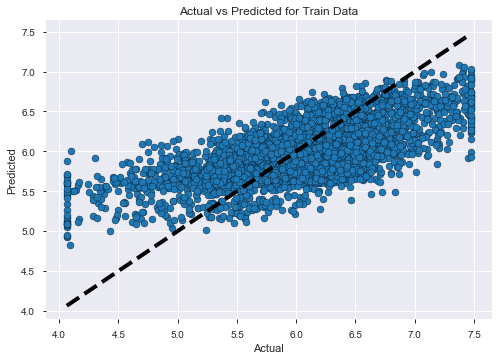

In [165]:
fig, ax = plt.subplots()
ax.scatter(train_y, pred, edgecolors=(0, 0, 0))
ax.plot([train_y.min(), train_y.max()], [train_y.min(), train_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Train Data")
plt.show()

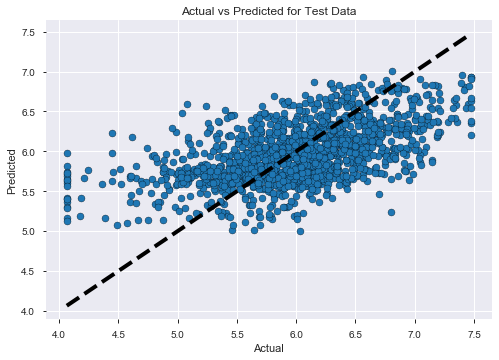

In [166]:
fig, ax = plt.subplots()
ax.scatter(test_y, y_pred, edgecolors=(0, 0, 0))
ax.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Test Data")
plt.show()

# Support Vector Regression (SVR)

In [167]:
from sklearn.svm import SVR

In [168]:
svr = SVR()
svr.fit(train_X, train_y)
y_pred=svr.predict(test_X)

In [169]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.48017466494203775
Mean Squared Error: 0.38647120871768487
Root Mean Squared Error: 0.6216680856515676


In [170]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",svr.score(train_X, train_y))
print("R-squared for Test:",svr.score(test_X, test_y))

R-squared for Train: 0.9280081990447361
R-squared for Test: 0.003391090539343833


### Tuning a SVR Model

In [171]:
svr1 = SVR()

In [172]:
parameters = {'C':[1, 10, 100, 1000, 10000],
              'gamma': [1e-7, 1e-4, 1e-3, 0.01, 0.1, 0.2, 0.5, 0.6, 0.9],
              'epsilon':[0.1,0.5]}

In [173]:
svr = GridSearchCV(svr1,parameters,cv=5)

grid_result = svr.fit(train_X, train_y)

In [174]:
print(svr.best_score_)

0.09414129122554296


In [175]:
print(svr.best_params_)

{'C': 10, 'epsilon': 0.5, 'gamma': 1e-07}


### Building Final SVR Model

In [176]:
svr = SVR(C=10, gamma=1e-07, epsilon=0.5)
svr.fit(train_X, train_y)
pred=svr.predict(train_X)
y_pred=svr.predict(test_X)

In [177]:
scores = cross_val_score(svr, train_X, train_y, cv=10, scoring='r2')
scores

array([0.05582679, 0.05542716, 0.10060161, 0.15257836, 0.05619591,
       0.09947297, 0.07664996, 0.13254199, 0.09983348, 0.06762742])

In [178]:
round( np.mean( cross_val_score( svr,
                              train_X,
                              train_y,
                              scoring = 'r2',
                              cv = 10 ) ), 2 )

0.09

In [179]:
dt=pd.DataFrame({'Actual':test_y, 'Predicted':y_pred})
dt

,Actual,Predicted
4133,6.289808,5.941267
3771,7.348768,6.344604
26,6.307497,5.849938
2049,5.730652,5.909423
3385,6.283294,6.887925
2240,5.386740,5.698977
671,6.410520,5.871772
3049,6.566293,6.344846
3543,6.103677,6.281998
522,6.106310,5.836598


In [180]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.4619689565081021
Mean Squared Error: 0.35391815996562187
Root Mean Squared Error: 0.5949102116837648


In [181]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",svr.score(train_X, train_y))
print("R-squared for Test:",svr.score(test_X, test_y))

R-squared for Train: 0.15725884947957458
R-squared for Test: 0.08733695166586375


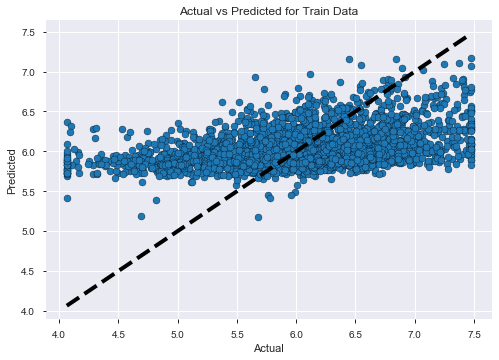

In [182]:
fig, ax = plt.subplots()
ax.scatter(train_y, pred, edgecolors=(0, 0, 0))
ax.plot([train_y.min(), train_y.max()], [train_y.min(), train_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Train Data")
plt.show()

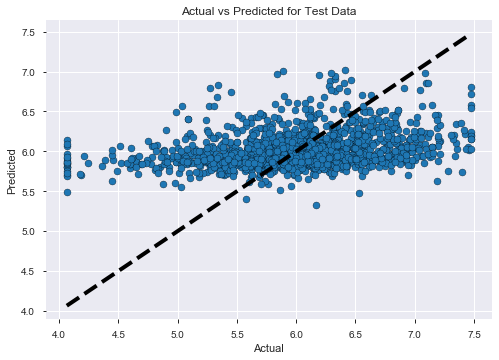

In [183]:
fig, ax = plt.subplots()
ax.scatter(test_y, y_pred, edgecolors=(0, 0, 0))
ax.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Test Data")
plt.show()

# KNN

In [184]:
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt

In [185]:
knn = neighbors.KNeighborsRegressor(n_neighbors=5)
knn.fit(train_X, train_y)
y_pred=knn.predict(test_X)

In [186]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.5338482295285997
Mean Squared Error: 0.4590101243484911
Root Mean Squared Error: 0.6775028592917458


In [187]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",knn.score(train_X, train_y))
print("R-squared for Test:",knn.score(test_X, test_y))

R-squared for Train: 0.23110812464974773
R-squared for Test: -0.18366793991248453


### Tuning a KNN Model

In [188]:
rmse_val = [] #to store rmse values for different k
for K in range(20,70):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(train_X, train_y)  #fit the model
    pred=model.predict(test_X) #make prediction on test set
    error = sqrt(mean_squared_error(test_y,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  21 is: 0.6320040497251175
RMSE value for k=  22 is: 0.6314246757504898
RMSE value for k=  23 is: 0.6304434133725452
RMSE value for k=  24 is: 0.6302077818446855
RMSE value for k=  25 is: 0.6286812634693137
RMSE value for k=  26 is: 0.6297288424714108
RMSE value for k=  27 is: 0.6308754597728233
RMSE value for k=  28 is: 0.6299873619052179
RMSE value for k=  29 is: 0.6278175986350514
RMSE value for k=  30 is: 0.6275548163310101
RMSE value for k=  31 is: 0.6277056756568051
RMSE value for k=  32 is: 0.6272804774979978
RMSE value for k=  33 is: 0.6273379657408314
RMSE value for k=  34 is: 0.6274223535290895
RMSE value for k=  35 is: 0.6262209651004251
RMSE value for k=  36 is: 0.6264216520994561
RMSE value for k=  37 is: 0.6263673411632964
RMSE value for k=  38 is: 0.6268078016808437
RMSE value for k=  39 is: 0.6264164220589867
RMSE value for k=  40 is: 0.6256600578609623
RMSE value for k=  41 is: 0.6242001288593432
RMSE value for k=  42 is: 0.6235858974358909
RMSE value

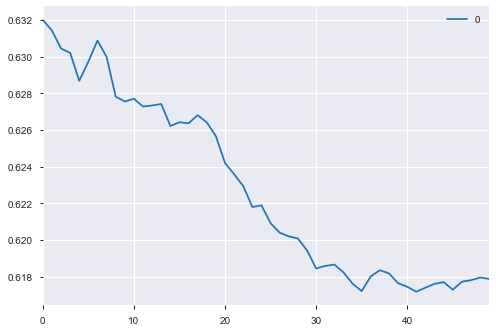

In [189]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()

### Building Final KNN Model

In [190]:
knn = neighbors.KNeighborsRegressor(n_neighbors=62)
knn.fit(train_X, train_y)
pred=knn.predict(train_X)
y_pred=knn.predict(test_X)

In [191]:
scores = cross_val_score(knn, train_X, train_y, cv=10, scoring='r2')
scores

array([-0.02592482, -0.01976156,  0.01055881,  0.03618692, -0.00922814,
        0.00949903,  0.00421993,  0.0244587 , -0.00449347, -0.0018611 ])

In [192]:
round( np.mean( cross_val_score( knn,
                              train_X,
                              train_y,
                              scoring = 'r2',
                              cv = 10 ) ), 2 )

0.0

In [193]:
dt=pd.DataFrame({'Actual':test_y, 'Predicted':y_pred})
dt

,Actual,Predicted
4133,6.289808,5.998367
3771,7.348768,5.980555
26,6.307497,5.968117
2049,5.730652,5.931065
3385,6.283294,5.951875
2240,5.386740,5.887238
671,6.410520,6.169071
3049,6.566293,5.959721
3543,6.103677,6.044993
522,6.106310,5.932295


In [194]:
print('Mean Absolute Error:', metrics.mean_absolute_error(test_y, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(test_y, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))

Mean Absolute Error: 0.47791846441827607
Mean Squared Error: 0.38091471004473265
Root Mean Squared Error: 0.6171828821708625


In [195]:
#Let's print the R-squared value for train/test. This explains how much of the variance in the data our model is.
print("R-squared for Train:",knn.score(train_X, train_y))
print("R-squared for Test:",knn.score(test_X, test_y))

R-squared for Train: 0.03655198560286832
R-squared for Test: 0.017719858007545275


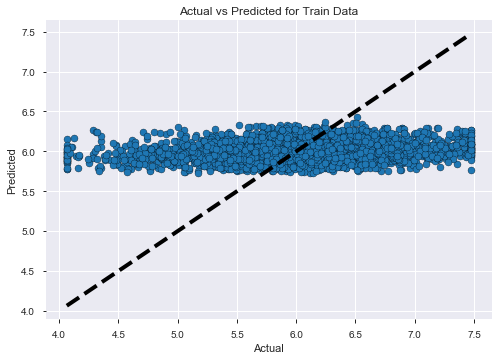

In [196]:
fig, ax = plt.subplots()
ax.scatter(train_y, pred, edgecolors=(0, 0, 0))
ax.plot([train_y.min(), train_y.max()], [train_y.min(), train_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Train Data")
plt.show()

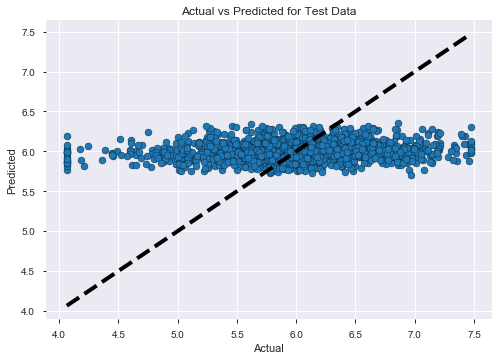

In [197]:
fig, ax = plt.subplots()
ax.scatter(test_y, y_pred, edgecolors=(0, 0, 0))
ax.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Actual vs Predicted for Test Data")
plt.show()